<h1> Housing Price Prediction </h1>

<p>
Predicting housing prices may significantly reduce the time & cost of searching and improve return on investment.  This notebook is focused on evaluating attributes of housing that may influence the price of homes.  The objective is to cleanse & explore the data, prepare the features, and build rudimentary data science models. A near-future revision of the notebook shall include a comparison with automl, as that's the final target.<br>

<h3 id="dataengr">Data Requirements and Collection</h3>
<p>
<h5 id="assumption">Data Requirements</h5>
    For conceptual demonstration, an open source dataset for housing prices shall suffice<br>
<h5 id="approach">Data Collection</h5>
Leverage diabetic dataset from UCI for concept illustration<br>
<ul>
    <li>data source: <a href="https://www.dcc.fc.up.pt/~ltorgo/Regression/cal_housing.html" target="_blank">https://www.dcc.fc.up.pt/~ltorgo/Regression/cal_housing.html</a></li>                    
</ul>
</p>
    
</p>

In [1]:
import pandas as pd
import pylab as pl
import numpy as np
import scipy.optimize as opt
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
%matplotlib inline 
import matplotlib.pyplot as plt

In [2]:
import os
%matplotlib inline
import matplotlib.pyplot as plt

# Save charts
def save_chart(fig_id, tight_layout=True, fig_extension="png", resolution=300):
    path = os.path.join(fig_id + "." + fig_extension)
    if tight_layout:
        plt.tight_layout()
    plt.savefig(path, format=fig_extension, dpi=resolution)

In [3]:
housing_df = pd.read_csv("housing.csv")
housing_df.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


In [4]:
housing_df.shape

(20640, 10)

In [5]:
housing_df.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,20640.000000,20640.000000,20640.000000,20640.000000,20433.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,-119.569704,35.631861,28.639486,2635.763081,537.870553,1425.476744,499.539680,3.870671,206855.816909
std,2.003532,2.135952,12.585558,2181.615252,421.385070,1132.462122,382.329753,1.899822,115395.615874
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.800000,33.930000,18.000000,1447.750000,296.000000,787.000000,280.000000,2.563400,119600.000000
50%,-118.490000,34.260000,29.000000,2127.000000,435.000000,1166.000000,409.000000,3.534800,179700.000000
75%,-118.010000,37.710000,37.000000,3148.000000,647.000000,1725.000000,605.000000,4.743250,264725.000000
max,-114.310000,41.950000,52.000000,39320.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000


In [6]:
housing_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.6+ MB


<h3> Missing values </h3>
Analyze all the columns identifying missing values represented as NaN

In [7]:
# In the dataset replace all "?" with NaN
import numpy as np

# replace "?" to NaN
housing_df.replace("?", np.nan, inplace = True)
housing_df.head(5)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


In [8]:
missing_data = housing_df.isnull()
missing_data.head(5)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False


In [9]:
# Print all columns, and determine those columns with a True where no data exists and must be either replaced or dropped
for column in missing_data.columns.values.tolist():
        print("column #:", column, "", housing_df.loc[0, column])
        print (missing_data[column].value_counts())
        print("") 

column #: longitude  -122.23
False    20640
Name: longitude, dtype: int64

column #: latitude  37.88
False    20640
Name: latitude, dtype: int64

column #: housing_median_age  41.0
False    20640
Name: housing_median_age, dtype: int64

column #: total_rooms  880.0
False    20640
Name: total_rooms, dtype: int64

column #: total_bedrooms  129.0
False    20433
True       207
Name: total_bedrooms, dtype: int64

column #: population  322.0
False    20640
Name: population, dtype: int64

column #: households  126.0
False    20640
Name: households, dtype: int64

column #: median_income  8.3252
False    20640
Name: median_income, dtype: int64

column #: median_house_value  452600.0
False    20640
Name: median_house_value, dtype: int64

column #: ocean_proximity  NEAR BAY
False    20640
Name: ocean_proximity, dtype: int64



In [10]:
# The only attribute with missing values is total_bedrooms.  Replace missing values with the median
housing_df["total_bedrooms"].replace(np.nan, housing_df["total_bedrooms"].median(), inplace=True)

<h3> Data Exploration </h3>

Explore housing attributes through the values.

In [11]:
housing_df["housing_median_age"].value_counts()

52.0    1273
36.0     862
35.0     824
16.0     771
17.0     698
34.0     689
26.0     619
33.0     615
18.0     570
25.0     566
32.0     565
37.0     537
15.0     512
19.0     502
27.0     488
24.0     478
30.0     476
28.0     471
20.0     465
29.0     461
31.0     458
23.0     448
21.0     446
14.0     412
22.0     399
38.0     394
39.0     369
42.0     368
44.0     356
43.0     353
40.0     304
13.0     302
41.0     296
45.0     294
10.0     264
11.0     254
46.0     245
5.0      244
12.0     238
8.0      206
9.0      205
47.0     198
4.0      191
48.0     177
7.0      175
6.0      160
50.0     136
49.0     134
3.0       62
2.0       58
51.0      48
1.0        4
Name: housing_median_age, dtype: int64

In [12]:
housing_df["median_income"].value_counts()

3.1250     49
15.0001    49
2.8750     46
4.1250     44
2.6250     44
           ..
4.1514      1
1.2614      1
2.0294      1
6.7079      1
3.7306      1
Name: median_income, Length: 12928, dtype: int64

In [13]:
housing_df["median_house_value"].value_counts()

500001.0    965
137500.0    122
162500.0    117
112500.0    103
187500.0     93
           ... 
303200.0      1
307900.0      1
383200.0      1
360800.0      1
405500.0      1
Name: median_house_value, Length: 3842, dtype: int64

In [14]:
housing_df["ocean_proximity"].value_counts()

<1H OCEAN     9136
INLAND        6551
NEAR OCEAN    2658
NEAR BAY      2290
ISLAND           5
Name: ocean_proximity, dtype: int64

<h3> Option 1 - One Hot Encoding </h3>

Create dummy variable and add new columns while dropping the original ocean_proximity column

In [15]:
test_df = housing_df
dummy_variable_1 = pd.get_dummies(test_df["ocean_proximity"])
dummy_variable_1.rename(columns={'ocean_proximity':'oc'}, inplace=True)
test_df = pd.concat([test_df, dummy_variable_1], axis=1)
test_df.drop("ocean_proximity", axis = 1, inplace=True)

In [16]:
test_df

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,<1H OCEAN,INLAND,ISLAND,NEAR BAY,NEAR OCEAN
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,0,0,0,1,0
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,0,0,0,1,0
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,0,0,0,1,0
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,0,0,0,1,0
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20635,-121.09,39.48,25.0,1665.0,374.0,845.0,330.0,1.5603,78100.0,0,1,0,0,0
20636,-121.21,39.49,18.0,697.0,150.0,356.0,114.0,2.5568,77100.0,0,1,0,0,0
20637,-121.22,39.43,17.0,2254.0,485.0,1007.0,433.0,1.7000,92300.0,0,1,0,0,0
20638,-121.32,39.43,18.0,1860.0,409.0,741.0,349.0,1.8672,84700.0,0,1,0,0,0


<h3> Option 2 - One Hot Encoding </h3>

Using OneHotEncoder from sklearn and a transform, creating an array corresponding to new columns while dropping the original ocean_proximity column

In [17]:
housing_cat = housing_df[['ocean_proximity']]

In [18]:
from sklearn.preprocessing import OneHotEncoder

cat_encoder = OneHotEncoder(sparse=False)
housing_cat_1hot = cat_encoder.fit_transform(housing_cat)
housing_cat_1hot

array([[0., 0., 0., 1., 0.],
       [0., 0., 0., 1., 0.],
       [0., 0., 0., 1., 0.],
       ...,
       [0., 1., 0., 0., 0.],
       [0., 1., 0., 0., 0.],
       [0., 1., 0., 0., 0.]])

In [19]:
cat_encoder.categories_

[array(['<1H OCEAN', 'INLAND', 'ISLAND', 'NEAR BAY', 'NEAR OCEAN'],
       dtype=object)]

<h3> Data Visualization </h3>

<p>
    Visualize data patterns through histogram plots of all the attributes. <br>
    
</p>

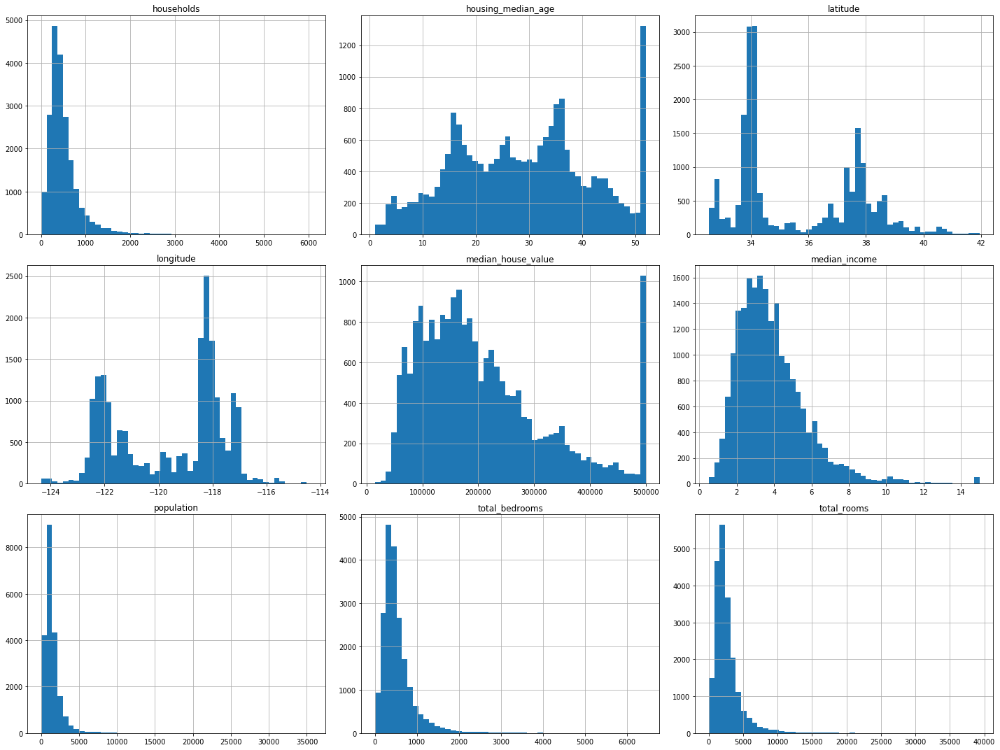

In [20]:
%matplotlib inline
import matplotlib.pyplot as plt
housing_df.hist(bins=50, figsize=(20,15))
save_chart("housing_attribute_histogram_plots")
plt.show()

<h3> Potential Predictors </h3>

<p>
Visualize potential predictors of home price through the combination of attributes.  <br>
    
</p>

In [21]:
# Use seaborn for improved visualization
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline 

,total_bedrooms,median_house_value
total_bedrooms,1.000000,0.049457
median_house_value,0.049457,1.000000


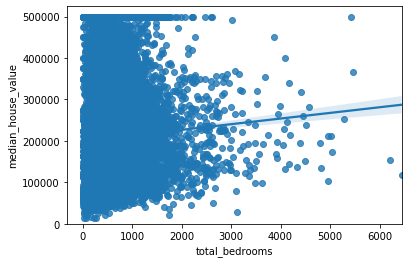

In [22]:
# Total bedrooms as potential predictor variable of housing price; price vs total bedrooms
sns.regplot(x="total_bedrooms", y="median_house_value", data=housing_df)
plt.ylim(0,)
housing_df[["total_bedrooms", "median_house_value"]].corr()

,housing_median_age,median_house_value
housing_median_age,1.000000,0.105623
median_house_value,0.105623,1.000000


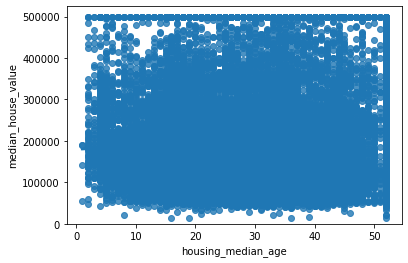

In [23]:
# Housing median age as potential predictor variable of housing price; price vs Housing median age
sns.regplot(x="housing_median_age", y="median_house_value", data=housing_df)
plt.ylim(0,)
housing_df[["housing_median_age", "median_house_value"]].corr()

,median_income,median_house_value
median_income,1.000000,0.688075
median_house_value,0.688075,1.000000


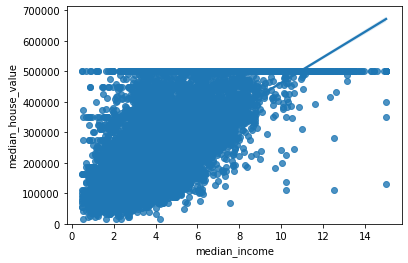

In [24]:
# Median income as potential predictor variable of housing price; price vs Median income
sns.regplot(x="median_income", y="median_house_value", data=housing_df)
plt.ylim(0,)
housing_df[["median_income", "median_house_value"]].corr()

,population,median_house_value
population,1.00000,-0.02465
median_house_value,-0.02465,1.00000


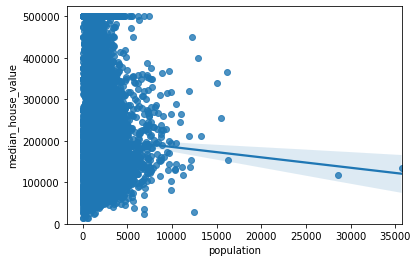

In [25]:
# Population as potential predictor variable of housing price; price vs population
sns.regplot(x="population", y="median_house_value", data=housing_df)
plt.ylim(0,)
housing_df[["population", "median_house_value"]].corr()

<h3> Generate map of California </h3>

<p>
On the map of California plot a yellow circle referencing each latitude and longitude per home from the data file to visualize the density of homes spanning districts/counties. <br>
    
</p>

In [26]:
import folium

In [27]:
# California latitude and longitude values
latitude = 36.7783
longitude = -119.4179

In [28]:
# create map and display it
cal_map = folium.Map(location=[latitude, longitude], zoom_start=6)

# display the map of California
cal_map

In [29]:
# instantiate a feature group for the incidents in the dataframe
homes = folium.map.FeatureGroup()

# loop through the lat & long and add each to the homes feature group
for lat, lng, in zip(housing_df.latitude, housing_df.longitude):
    homes.add_child(
        folium.features.CircleMarker(
            [lat, lng],
            radius=5, # define how big you want the circle markers to be
            color='yellow',
            fill=True,
            fill_color='blue',
            fill_opacity=0.6
        )
    )

# add incidents to map
cal_map.add_child(homes)

In [30]:
corr_matrix = housing_df.corr()

In [31]:
corr_matrix["median_house_value"].sort_values(ascending=False)

median_house_value    1.000000
median_income         0.688075
total_rooms           0.134153
housing_median_age    0.105623
households            0.065843
total_bedrooms        0.049457
population           -0.024650
longitude            -0.045967
latitude             -0.144160
Name: median_house_value, dtype: float64

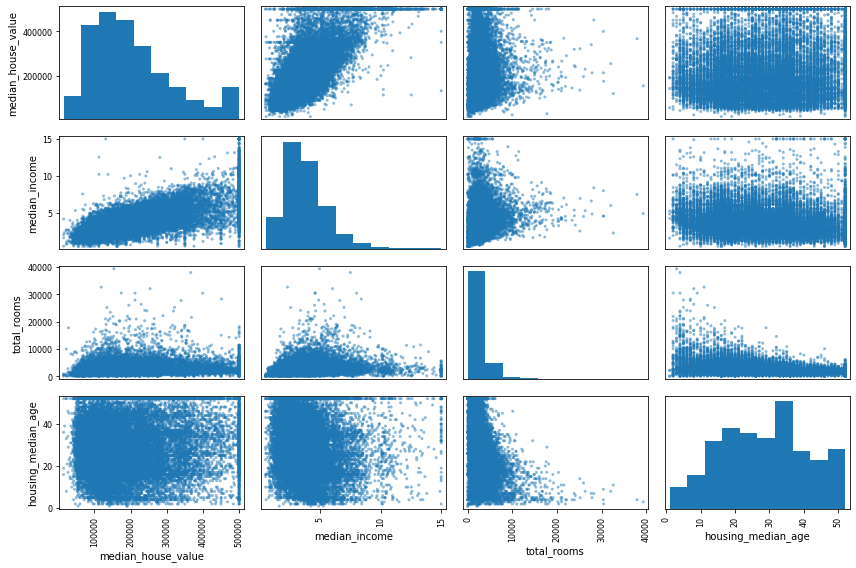

In [32]:
# From scatter plot visualize the correlations with respect to house value
from pandas.plotting import scatter_matrix

attributes = ["median_house_value", "median_income", "total_rooms",
              "housing_median_age"]
scatter_matrix(housing_df[attributes], figsize=(12, 8))
save_chart("scatter_matrix_plot")

<h3> Maximum House Value </h3>

Visualizing the scatter, the house value was restricted to $500,000 in the original data set.

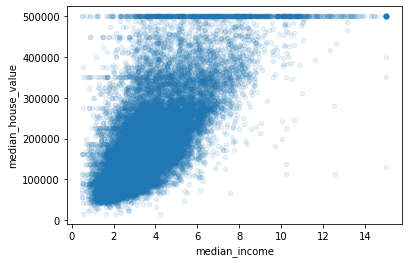

In [33]:
housing_df.plot(kind="scatter", x="median_income", y="median_house_value",
                 alpha=0.1)

<h3> Pearson Correlation </h3>

Assessing correlation among the attributes with the median house value.

In [34]:
# For Pearson correlation
from scipy import stats

In [36]:
pearson_coef, p_value = stats.pearsonr(housing_df['median_income'], housing_df['median_house_value'])
print("The Pearson Correlation Coefficient is", pearson_coef, " with a P-value of P = ", p_value) 

The Pearson Correlation Coefficient is 0.6880752079585479  with a P-value of P =  0.0


In [37]:
pearson_coef, p_value = stats.pearsonr(housing_df['total_rooms'], housing_df['median_house_value'])
print("The Pearson Correlation Coefficient is", pearson_coef, " with a P-value of P = ", p_value)

The Pearson Correlation Coefficient is 0.13415311380656314  with a P-value of P =  1.6893845634754333e-83


In [38]:
pearson_coef, p_value = stats.pearsonr(housing_df['housing_median_age'], housing_df['median_house_value'])
print("The Pearson Correlation Coefficient is", pearson_coef, " with a P-value of P = ", p_value)

The Pearson Correlation Coefficient is 0.10562341249320994  with a P-value of P =  2.7618606761502365e-52


<h3 id="model">Modeling building and evaluation</h3>
<p>
<h5 id="traintest">Training & testing the model</h5>
    Split the dataset into training & testing sets<br>
<h5 id="eval">Evaluate model</h5>
    Visually inspect the model for overfitting, underfitting<br>
<h5 id="optimize">Optimizing the model</h5>
    Using grid search to find the optimal parameters and tune the model<br>
</p>

In [39]:
y_data = housing_df['median_house_value']
x_data = housing_df.drop('median_house_value',axis=1)

In [40]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x_data, y_data, test_size=0.15, random_state=1)

In [41]:
from sklearn.linear_model import LinearRegression
lre=LinearRegression()

<h5 id="single">Single Attribute</h5>

Predict house value using a single attribute.


In [42]:
lre.fit(x_train[['median_income']], y_train)
lre.score(x_test[['median_income']], y_test)
lre.score(x_train[['median_income']], y_train)

0.4740534381462087

In [43]:
from sklearn.model_selection import cross_val_score
Rcross = cross_val_score(lre, x_data[['median_income']], y_data, cv=4)
-1 * cross_val_score(lre,x_data[['median_income']], y_data,cv=4,scoring='neg_mean_squared_error')

array([6.51975482e+09, 7.77530931e+09, 5.88873195e+09, 8.99683568e+09])

In [44]:
from sklearn.model_selection import cross_val_predict
yhat = cross_val_predict(lre,x_data[['median_income']], y_data,cv=4)
yhat[0:5]

array([397719.40693457, 396723.50728852, 353037.82533562, 285488.2119481 ,
       210297.78867112])

<h5 id="linear">Linear Regression</h5>

Predict house value using multiple attributes.

In [45]:
# Linear regression model
lr = LinearRegression()
lr.fit(x_train[['median_income', 'total_rooms', 'housing_median_age']], y_train)
yhat_train = lr.predict(x_train[['median_income', 'total_rooms', 'housing_median_age']])
yhat_train[0:5]
yhat_test = lr.predict(x_test[['median_income', 'total_rooms', 'housing_median_age']])
yhat_test[0:5]

array([201940.70568748, 141282.67752548, 244606.79692841, 144462.45789967,
       275365.4794037 ])

<h5 id="forest">Random Forest</h5>

Predict house value using multiple attributes.

In [52]:
from sklearn.ensemble import RandomForestRegressor
r_forest = RandomForestRegressor()
r_forest.fit(x_train[['median_income', 'total_rooms', 'housing_median_age']], y_train)
yhat_train = r_forest.predict(x_train[['median_income', 'total_rooms', 'housing_median_age']])
yhat_train[0:5]
yhat_test = r_forest.predict(x_test[['median_income', 'total_rooms', 'housing_median_age']])
yhat_test[0:5]

array([172413.04, 131652.  , 251291.01, 189021.  , 345368.09])

<h3 id="result">Modeling Evaluation Outcome</h3>

Without imputation, feature scaling, and normalization, the predicted house value is more than 50% from the expected.
Lessons learned: complete the feature engineering exercises for better results.  A revised notebook indicates randomforest and SVM are better predictors of house value.  For pragmatic application, another notebook revealed improved modeling results using additional attributes such as crime, demographics, school ranking, number of businesses, type of businesses, municipality ranking, property tax, business income tax, tourist locations, and population size.